In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
sns.set()


In [2]:
df=pd.read_csv("retail_store_inventory.csv")
df

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Weather Condition,Holiday/Promotion,Competitor Pricing,Seasonality
0,2022-01-01,S001,P0001,Groceries,North,231,127,55,135.47,33.50,20,Rainy,0,29.69,Autumn
1,2022-01-01,S001,P0002,Toys,South,204,150,66,144.04,63.01,20,Sunny,0,66.16,Autumn
2,2022-01-01,S001,P0003,Toys,West,102,65,51,74.02,27.99,10,Sunny,1,31.32,Summer
3,2022-01-01,S001,P0004,Toys,North,469,61,164,62.18,32.72,10,Cloudy,1,34.74,Autumn
4,2022-01-01,S001,P0005,Electronics,East,166,14,135,9.26,73.64,0,Sunny,0,68.95,Summer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73095,2024-01-01,S005,P0016,Furniture,East,96,8,127,18.46,73.73,20,Snowy,0,72.45,Winter
73096,2024-01-01,S005,P0017,Toys,North,313,51,101,48.43,82.57,10,Cloudy,0,83.78,Autumn
73097,2024-01-01,S005,P0018,Clothing,West,278,36,151,39.65,11.11,10,Rainy,0,10.91,Winter
73098,2024-01-01,S005,P0019,Toys,East,374,264,21,270.52,53.14,20,Rainy,0,55.80,Spring


In [3]:
 df.isnull().sum()

Date                  0
Store ID              0
Product ID            0
Category              0
Region                0
Inventory Level       0
Units Sold            0
Units Ordered         0
Demand Forecast       0
Price                 0
Discount              0
Weather Condition     0
Holiday/Promotion     0
Competitor Pricing    0
Seasonality           0
dtype: int64

In [4]:
df.describe()

,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Holiday/Promotion,Competitor Pricing
count,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000
mean,274.469877,136.464870,110.004473,141.494720,55.135108,10.009508,0.497305,55.146077
std,129.949514,108.919406,52.277448,109.254076,26.021945,7.083746,0.499996,26.191408
min,50.000000,0.000000,20.000000,-9.990000,10.000000,0.000000,0.000000,5.030000
25%,162.000000,49.000000,65.000000,53.670000,32.650000,5.000000,0.000000,32.680000
50%,273.000000,107.000000,110.000000,113.015000,55.050000,10.000000,0.000000,55.010000
75%,387.000000,203.000000,155.000000,208.052500,77.860000,15.000000,1.000000,77.820000
max,500.000000,499.000000,200.000000,518.550000,100.000000,20.000000,1.000000,104.940000


In [5]:
category_sales = df.groupby('Category')['Units Sold'].sum().reset_index()

# Sort by units sold in descending order
sorted_category_sales = category_sales.sort_values(by='Units Sold', ascending=False)

print(sorted_category_sales)

      Category  Units Sold
2    Furniture     2025017
3    Groceries     2000482
0     Clothing     1999166
4         Toys     1990485
1  Electronics     1960432


In [6]:
q=df["Units Sold"].quantile(.99)
df=df[df["Units Sold"]<q]
p=df["Demand Forecast"].quantile(.99)
df=df[df["Demand Forecast"]<p]

In [7]:
df = df[df['Units Sold'] <= 400]

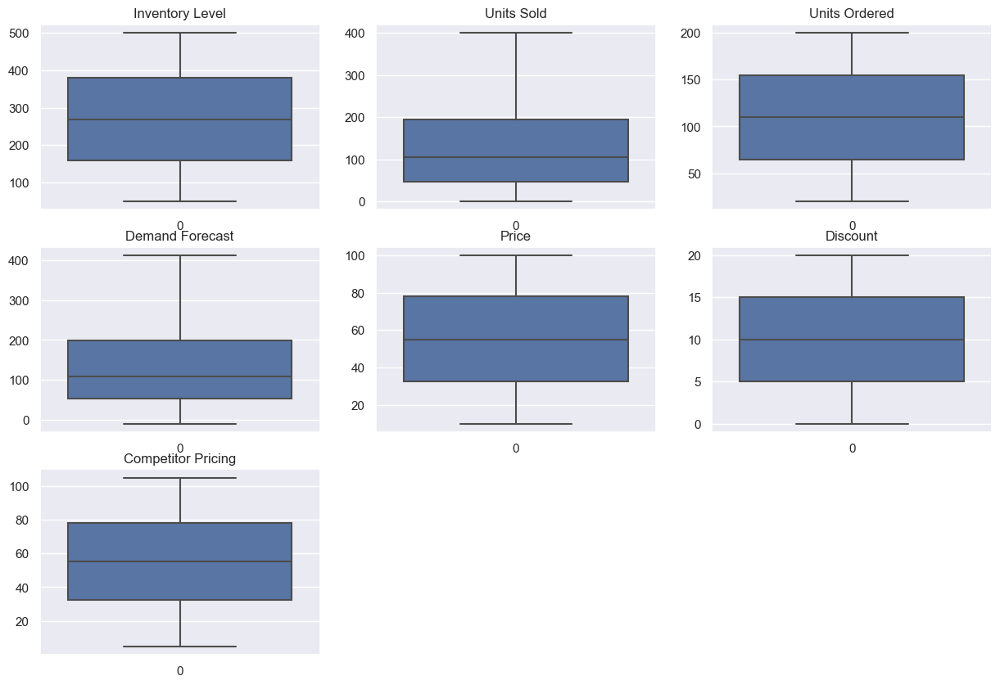

In [8]:
columns_under=['Inventory Level','Units Sold','Units Ordered','Demand Forecast','Price','Discount','Competitor Pricing']
plt.figure(figsize=(15, 10)) 
for i ,col in enumerate(columns_under):
    plt.subplot(3,3,i+1)
    sns.boxplot(df[col])
    plt.title(col)
plt.show()    

In [9]:
df.describe()

,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Holiday/Promotion,Competitor Pricing
count,71350.000000,71350.000000,71350.000000,71350.000000,71350.000000,71350.000000,71350.000000,71350.000000
mean,269.782775,129.210133,109.996062,134.237472,55.146476,10.011352,0.497772,55.154930
std,127.938926,99.709176,52.256908,100.069009,26.024042,7.084079,0.499999,26.193469
min,50.000000,0.000000,20.000000,-9.990000,10.000000,0.000000,0.000000,5.030000
25%,159.250000,47.000000,65.000000,52.500000,32.640000,5.000000,0.000000,32.680000
50%,268.000000,104.000000,110.000000,109.490000,55.050000,10.000000,0.000000,55.025000
75%,379.000000,194.000000,155.000000,198.707500,77.887500,15.000000,1.000000,77.850000
max,500.000000,400.000000,200.000000,412.630000,100.000000,20.000000,1.000000,104.940000


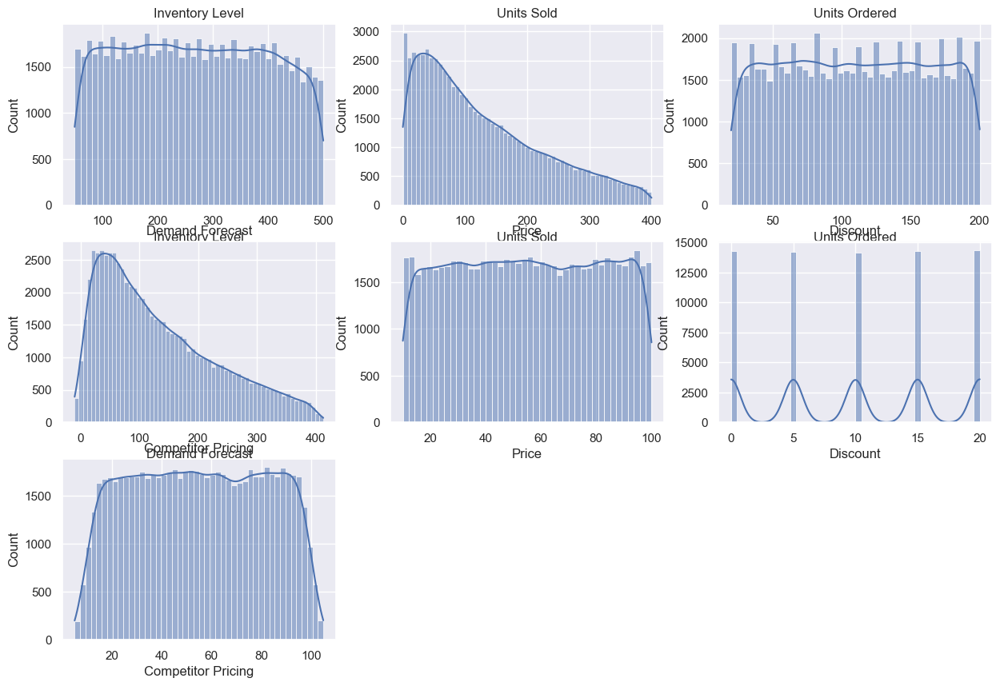

In [10]:
columns_under=['Inventory Level','Units Sold','Units Ordered','Demand Forecast','Price','Discount','Competitor Pricing']
plt.figure(figsize=(15, 10)) 
for i ,col in enumerate(columns_under):
    plt.subplot(3,3,i+1)
    sns.histplot(df[col],kde=True)
    plt.title(col)
plt.show()  

In [11]:
from scipy.stats import boxcox
df['new_unitsold'], _ = boxcox(df['Units Sold'] + 1)  # Add 1 to avoid zero values


C:\Users\Dell\AppData\Local\Temp\ipykernel_22256\2428083696.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['new_unitsold'])


<AxesSubplot: xlabel='new_unitsold', ylabel='Density'>

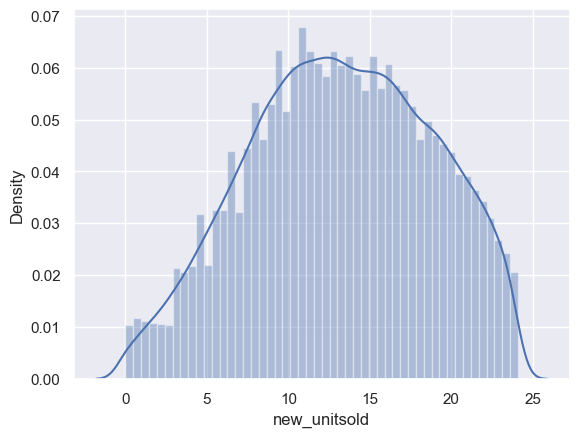

In [12]:
sns.distplot(df['new_unitsold'])

df['new_unitsold'].skew()


In [13]:
df['new_unitsold'].max()

24.08259536887755

In [14]:
df['new_unitsold'].min()

0.0

In [15]:
df['new_unitsold'].mean()

13.187650391208617

In [16]:
df['new_unitsold'].skew()

-0.11392740577532012

In [17]:
df['new_demand'], _ = boxcox(df['Demand Forecast'] + 10)

C:\Users\Dell\AppData\Local\Temp\ipykernel_22256\2483641793.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['new_demand'])


<AxesSubplot: xlabel='new_demand', ylabel='Density'>

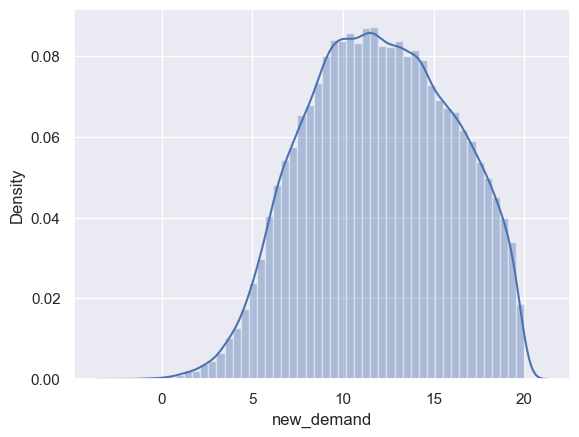

In [18]:
sns.distplot(df['new_demand'])

In [19]:
print(df['Demand Forecast'].min())  # Check the minimum value


-9.99


In [20]:
df['new_demand'].skew()

-0.0688692173048143

In [21]:
df

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Weather Condition,Holiday/Promotion,Competitor Pricing,Seasonality,new_unitsold,new_demand
0,2022-01-01,S001,P0001,Groceries,North,231,127,55,135.47,33.50,20,Rainy,0,29.69,Autumn,14.489843,13.024956
1,2022-01-01,S001,P0002,Toys,South,204,150,66,144.04,63.01,20,Sunny,0,66.16,Autumn,15.627495,13.338287
2,2022-01-01,S001,P0003,Toys,West,102,65,51,74.02,27.99,10,Sunny,1,31.32,Summer,10.600693,10.310158
3,2022-01-01,S001,P0004,Toys,North,469,61,164,62.18,32.72,10,Cloudy,1,34.74,Autumn,10.282981,9.644063
4,2022-01-01,S001,P0005,Electronics,East,166,14,135,9.26,73.64,0,Sunny,0,68.95,Summer,4.815420,5.094507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73095,2024-01-01,S005,P0016,Furniture,East,96,8,127,18.46,73.73,20,Snowy,0,72.45,Winter,3.480680,6.233979
73096,2024-01-01,S005,P0017,Toys,North,313,51,101,48.43,82.57,10,Cloudy,0,83.78,Autumn,9.429699,8.772607
73097,2024-01-01,S005,P0018,Clothing,West,278,36,151,39.65,11.11,10,Rainy,0,10.91,Winter,7.936362,8.142521
73098,2024-01-01,S005,P0019,Toys,East,374,264,21,270.52,53.14,20,Rainy,0,55.80,Spring,20.099742,17.012514


In [22]:
df['Date'] = pd.to_datetime(df['Date'])

In [23]:
df['Date'].unique

<bound method Series.unique of 0       2022-01-01
1       2022-01-01
2       2022-01-01
3       2022-01-01
4       2022-01-01
           ...    
73095   2024-01-01
73096   2024-01-01
73097   2024-01-01
73098   2024-01-01
73099   2024-01-01
Name: Date, Length: 71350, dtype: datetime64[ns]>

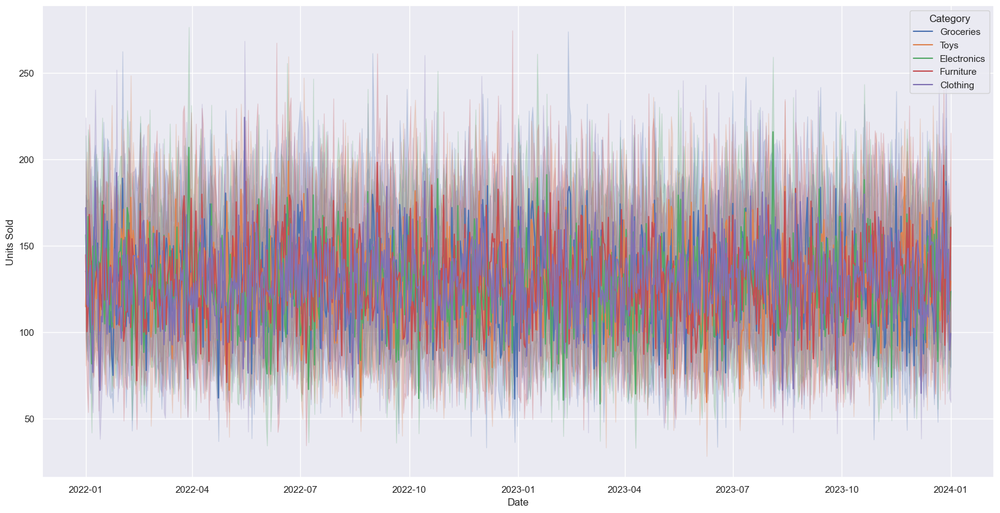

In [24]:
plt.figure(figsize=(20, 10)) 
sns.lineplot(x=df['Date'],y=df['Units Sold'],hue=df['Category'])
plt.show()

In [25]:
import plotly.express as px

In [26]:
px.line(df,x=df['Date'],y=df['Units Sold'],color='Category')

In [27]:
from sklearn.preprocessing import LabelEncoder
df['Category'] = LabelEncoder().fit_transform(df['Category'])
df = pd.get_dummies(df, columns=['Region','Seasonality','Weather Condition'], drop_first=True)


In [28]:
from sklearn.model_selection import train_test_split

# Select features and target
features = df.drop(['Units Sold', 'Date','Store ID','Product ID','Demand Forecast','new_unitsold'], axis=1)
target = df['new_unitsold']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)


In [29]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)  # Apply to training features


In [30]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Initialize the model
model = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model
model.fit(X_train, y_train)




RandomForestRegressor(random_state=42)

In [31]:
# Predict on the test set
y_pred = model.predict(X_test)




In [32]:
# Evaluate the model
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"Root Mean Squared Error: {rmse}")

Root Mean Squared Error: 0.7959972779954023


In [33]:
y_pred = model.predict(X_test)
rmse_test = np.sqrt(((y_pred - y_test) ** 2).mean())
print(f"Test RMSE: {rmse_test}")


Test RMSE: 0.7959972779954023


In [34]:
print(f"Actual values: {y_test[:10]}")
print(f"Predicted values: {y_pred[:10]}")


Actual values: 11534    17.336389
56260    15.437630
11216     8.366070
14875    20.912496
37812    17.377256
46378    22.274054
7461      8.046342
52952     3.208934
64761     8.046342
45360    12.101341
Name: new_unitsold, dtype: float64
Predicted values: [17.68662407 14.95418129  7.8486526  20.76011509 17.91048107 22.22176075
  6.91769812  4.99647553  7.76765541 12.73259852]


In [35]:
from sklearn.model_selection import cross_val_score



In [36]:
rmse_cv = np.sqrt(-cross_val_score(model, X_train, y_train, cv=5, scoring="neg_mean_squared_error"))
print(f"Cross-validated RMSE: {rmse_cv.mean()}")

Cross-validated RMSE: 0.8048913198919696


In [37]:
feature_importances = model.feature_importances_
sorted_idx = np.argsort(feature_importances)[::-1]
for idx in sorted_idx:
    print(f"{X_train.columns[idx]}: {feature_importances[idx]}")


new_demand: 0.9834472492520578
Inventory Level: 0.0033990401990291715
Units Ordered: 0.002987149804044797
Price: 0.0024472324706217054
Competitor Pricing: 0.002446876530847827
Discount: 0.001037608812760917
Category: 0.0010322204712646936
Holiday/Promotion: 0.000381635095918796
Seasonality_Spring: 0.0003220250711943646
Weather Condition_Snowy: 0.0003203639156376901
Weather Condition_Sunny: 0.0003154988185354368
Seasonality_Winter: 0.000314990928587108
Region_West: 0.00031465966149121734
Seasonality_Summer: 0.00031091645456516486
Region_North: 0.0003104607850498581
Weather Condition_Rainy: 0.0003102438473085947
Region_South: 0.000301827881084664


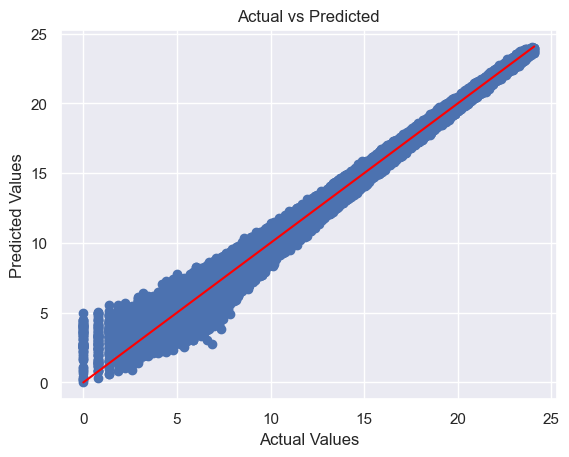

In [38]:
plt.scatter(y_test, y_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted")
plt.show()


In [ ]:

from sklearn.model_selection import GridSearchCV

# Create the Random Forest model
model = RandomForestRegressor()

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the model on the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and the best RMSE score
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best RMSE: {np.sqrt(-grid_search.best_score_)}")
